### CELL 1: Environment Setup & Kaggle Configuration

In [1]:
# Kaggle-specific setup and imports

import os
import sys
import random
from pathlib import Path

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image
from tqdm.notebook import tqdm  # Use notebook version for Kaggle
import matplotlib.pyplot as plt
import pickle
from collections import Counter
import re
from typing import Dict, List, Tuple, Optional

# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


KAGGLE_INPUT = Path("/kaggle/input/flickr8k")
KAGGLE_OUTPUT = Path("/kaggle/working")

# Verify dataset exists
if KAGGLE_INPUT.exists():
    print("[OK] Running on Kaggle")
    DATASET_DIR = KAGGLE_INPUT
    MODELS_DIR = KAGGLE_OUTPUT / "models"
else:
    print("[!!] Not on Kaggle - using local paths")
    DATASET_DIR = Path.cwd() / "dataset"
    MODELS_DIR = Path.cwd() / "models"

IMAGES_DIR = DATASET_DIR / "Images"
CAPTIONS_FILE = DATASET_DIR / "captions.txt"
MODELS_DIR.mkdir(parents=True, exist_ok=True)

# Model save paths
ENCODER_PATH = MODELS_DIR / "encoder.pth"
DECODER_PATH = MODELS_DIR / "decoder.pth"
VOCAB_PATH = MODELS_DIR / "vocab.pkl"

print(f">>> Dataset: {DATASET_DIR}")
print(f">>> Images: {IMAGES_DIR}")
print(f">>> Captions: {CAPTIONS_FILE}")
print(f">>> Models will be saved to: {MODELS_DIR}")

# Verify dataset files
assert IMAGES_DIR.exists(), f"Images directory not found: {IMAGES_DIR}"
assert CAPTIONS_FILE.exists(), f"Captions file not found: {CAPTIONS_FILE}"
print(f"[OK] Found {len(list(IMAGES_DIR.glob('*.jpg')))} images")


[OK] Running on Kaggle
>>> Dataset: /kaggle/input/flickr8k
>>> Images: /kaggle/input/flickr8k/Images
>>> Captions: /kaggle/input/flickr8k/captions.txt
>>> Models will be saved to: /kaggle/working/models
[OK] Found 8091 images


### CELL 2: Device Detection (GPU)

In [2]:
# Detect and configure GPU for training

# Detect device - Kaggle provides CUDA GPUs
if torch.cuda.is_available():
    device = torch.device('cuda')
    gpu_name = torch.cuda.get_device_name(0)
    gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"[OK] Using CUDA GPU: {gpu_name}")
    print(f"   GPU Memory: {gpu_memory:.1f} GB")
elif torch.backends.mps.is_available():
    device = torch.device('mps')
    print("[OK] Using MPS (Apple Silicon)")
else:
    device = torch.device('cpu')
    print("[!!] Using CPU - training will be slow!")

print(f"\n==== Device: {device}")

# Enable cudnn benchmark for faster training on GPU
if device.type == 'cuda':
    torch.backends.cudnn.benchmark = True

[OK] Using CUDA GPU: Tesla P100-PCIE-16GB
   GPU Memory: 17.1 GB

==== Device: cuda


### CELL 3: Hyperparameters Configuration


In [3]:
# OPTIMIZED training hyperparameters for best results

# Model Architecture
ENCODER_DIM = 2048      # InceptionV3 output dimension (feature size )
ATTENTION_DIM = 512     # Attention layer dimension (Controls how well the model focuses on image regions)
DECODER_DIM = 512       # LSTM hidden state dimension (Larger values improve language modeling)
EMBEDDING_DIM = 256     # Word embedding dimension(Maps words to dense vectors)
DROPOUT = 0.5           # Dropout rate for regularization

# Vocabulary Settings
MIN_WORD_FREQ = 5       # Minimum word frequency to include
MAX_CAPTION_LENGTH = 50 # Maximum caption length (tokens)

# ===== TRAINING HYPERPARAMETERS (OPTIMIZED FOR BEST RESULTS) =====
BATCH_SIZE = 32         # Good for GPU memory
NUM_WORKERS = 4         # Kaggle supports 4 workers (Parallel data loading)
EPOCHS = 40             # More epochs for better convergence

# (Lower decoder LR → smoother convergence • Much lower encoder LR → safe fine-tuning •	Prevents destroying pretrained CNN features)
LEARNING_RATE = 3e-4    # Slightly lower for stability
ENCODER_LR = 1e-4       # Lower LR for fine-tuning encoder

GRAD_CLIP = 5.0         # Gradient clipping threshold (Prevents exploding gradients in LSTM • Improves numerical stability)
EARLY_STOPPING_PATIENCE = 7  # More patience

LR_PATIENCE = 3         # Reduce LR after N epochs without improvement
LR_FACTOR = 0.5         # More aggressive LR reduction

# Teacher Forcing (reduces over time for better inference)
TEACHER_FORCING_RATIO = 1.0  # Start with full teacher forcing

# Fine-tuning encoder after N epochs (key for good results!)
FINE_TUNE_ENCODER_AFTER = 15  # Start fine-tuning encoder after epoch 15 (first 15 ecpchos=> cnn frozen)

# Data Split
TRAIN_RATIO = 0.85      # More training data 
VAL_RATIO = 0.10
TEST_RATIO = 0.05

# Image Preprocessing (InceptionV3 settings)
IMAGE_SIZE = 299
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# Inference
BEAM_SIZE = 5           # Larger beam for better captions (was 3)

print("[OK] Hyperparameters configured (OPTIMIZED)")
print(f"   Batch size: {BATCH_SIZE}")
print(f"   Epochs: {EPOCHS}")
print(f"   Initial LR: {LEARNING_RATE}")
print(f"   Fine-tune encoder after epoch: {FINE_TUNE_ENCODER_AFTER}")
print(f"   Beam size: {BEAM_SIZE}")


[OK] Hyperparameters configured (OPTIMIZED)
   Batch size: 32
   Epochs: 40
   Initial LR: 0.0003
   Fine-tune encoder after epoch: 15
   Beam size: 5


### CELL 4: Utility Functions

In [4]:
# Helper functions for data processing, vocabulary, and transforms

def parse_captions(captions_file: str, images_dir: str) -> Dict[str, List[str]]:
    """
    Parse the Flickr8k captions.txt file.
    
    File format:
        image,caption (header row - skipped)
        1000268201_693b08cb0e.jpg,A child in a pink dress...
    
    Returns:
        Dict mapping image filenames to list of captions (5 per image)
    """
    image_to_captions = {}
    images_path = Path(images_dir)
    missing_count = 0
    
    with open(captions_file, 'r', encoding='utf-8') as f:
        lines = f.readlines()
    
    # Skip header row
    for line in lines[1:]:
        line = line.strip()
        if not line:
            continue
        
        # Split only on first comma (caption may contain commas)
        parts = line.split(',', 1)
        if len(parts) != 2:
            continue
        
        image_name, caption = parts
        image_name = image_name.strip()
        caption = caption.strip()
        
        # Verify image exists
        if not (images_path / image_name).exists():
            missing_count += 1
            continue
        
        # Clean caption: lowercase, remove punctuation except apostrophes
        caption = caption.lower()
        caption = re.sub(r'[^\w\s\']', '', caption)
        caption = ' '.join(caption.split())
        
        if image_name not in image_to_captions:
            image_to_captions[image_name] = []
        image_to_captions[image_name].append(caption)
    
    total_captions = sum(len(v) for v in image_to_captions.values())
    print(f"[OK] Parsed {total_captions:,} captions from {len(image_to_captions):,} images")
    if missing_count > 0:
        print(f"   [!!] Skipped {missing_count} references to missing images")
    
    return image_to_captions


class Vocabulary:
    """Vocabulary for encoding/decoding captions."""
    
    PAD_TOKEN = '<PAD>'   # Index 0 - for padding
    START_TOKEN = '<START>'  # Index 1 - start of caption
    END_TOKEN = '<END>'      # Index 2 - end of caption
    UNK_TOKEN = '<UNK>'      # Index 3 - unknown words
    
    def __init__(self):
        self.word2idx = {
            self.PAD_TOKEN: 0,
            self.START_TOKEN: 1,
            self.END_TOKEN: 2,
            self.UNK_TOKEN: 3,
        }
        self.idx2word = {v: k for k, v in self.word2idx.items()}
        self.word_freq = Counter()
    
    def build_vocab(self, captions: List[str], min_freq: int = 5):
        """Build vocabulary from list of captions."""
        # Count word frequencies across all captions
        for caption in captions:
            words = caption.lower().split()
            self.word_freq.update(words)
        
        # Add words meeting frequency threshold
        for word, freq in self.word_freq.items():
            if freq >= min_freq and word not in self.word2idx:
                idx = len(self.word2idx)
                self.word2idx[word] = idx
                self.idx2word[idx] = word
        
        print(f"[OK] Vocabulary: {len(self.word2idx):,} words (min_freq={min_freq})")
        print(f"   Total unique words seen: {len(self.word_freq):,}")
    
    def encode(self, caption: str, max_length: int = 50) -> List[int]:
        """Encode caption string to list of word indices."""
        words = caption.lower().split()
        indices = [self.word2idx[self.START_TOKEN]]
        
        for word in words[:max_length - 2]:  # Reserve space for START and END
            idx = self.word2idx.get(word, self.word2idx[self.UNK_TOKEN])
            indices.append(idx)
        
        indices.append(self.word2idx[self.END_TOKEN])
        return indices
    
    def decode(self, indices: List[int], skip_special: bool = True) -> str:
        """Decode list of indices back to caption string."""
        special = {0, 1, 2, 3} if skip_special else set()
        words = [self.idx2word.get(idx, self.UNK_TOKEN) 
                 for idx in indices if idx not in special]
        return ' '.join(words)
    
    def __len__(self):
        return len(self.word2idx)
    
    def save(self, path: str):
        """Save vocabulary to pickle file."""
        with open(path, 'wb') as f:
            pickle.dump({
                'word2idx': self.word2idx, 
                'idx2word': self.idx2word,
                'word_freq': dict(self.word_freq)
            }, f)
        print(f"   Saved vocabulary to {path}")
    
    @classmethod
    def load(cls, path: str) -> 'Vocabulary':
        """Load vocabulary from pickle file."""
        vocab = cls()
        with open(path, 'rb') as f:
            data = pickle.load(f)
        vocab.word2idx = data['word2idx']
        vocab.idx2word = data['idx2word']
        vocab.word_freq = Counter(data.get('word_freq', {}))
        return vocab


def get_image_transforms(image_size: int, is_training: bool = False):
    """Get image transformation pipeline for InceptionV3."""
    if is_training:
        return transforms.Compose([
            transforms.Resize((image_size + 20, image_size + 20)),
            transforms.RandomCrop(image_size),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
            transforms.ToTensor(),
            transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
        ])
    else:
        return transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
        ])


print("[OK] Utility functions defined")


[OK] Utility functions defined


### CELL 5: Load and Parse Dataset

In [5]:
# Load the Flickr8k dataset and parse captions

print("=" * 60)
print("LOADING FLICKR8K DATASET")
print("=" * 60)

# Parse captions from the CSV file
image_to_captions = parse_captions(str(CAPTIONS_FILE), str(IMAGES_DIR))

# Display sample data
print("\n**** Sample Images and Captions:")
sample_images = list(image_to_captions.keys())[:3]

for img_name in sample_images:
    print(f"\n   Image: {img_name}")
    for i, caption in enumerate(image_to_captions[img_name][:2], 1):
        # Truncate long captions for display
        display_caption = caption[:70] + '...' if len(caption) > 70 else caption
        print(f"   Caption {i}: {display_caption}")


LOADING FLICKR8K DATASET
[OK] Parsed 40,455 captions from 8,091 images

**** Sample Images and Captions:

   Image: 1000268201_693b08cb0e.jpg
   Caption 1: a child in a pink dress is climbing up a set of stairs in an entry way
   Caption 2: a girl going into a wooden building

   Image: 1001773457_577c3a7d70.jpg
   Caption 1: a black dog and a spotted dog are fighting
   Caption 2: a black dog and a tricolored dog playing with each other on the road

   Image: 1002674143_1b742ab4b8.jpg
   Caption 1: a little girl covered in paint sits in front of a painted rainbow with...
   Caption 2: a little girl is sitting in front of a large painted rainbow


### CELL 6: Build Vocabulary

In [6]:
# Create vocabulary from all captions

print("\n" + "=" * 60)
print("BUILDING VOCABULARY")
print("=" * 60)

# Collect all captions into a flat list
all_captions = []
for captions in image_to_captions.values():
    all_captions.extend(captions)

print(f"   Total captions: {len(all_captions):,}")

# Build vocabulary with frequency thresholding
vocab = Vocabulary()
vocab.build_vocab(all_captions, min_freq=MIN_WORD_FREQ)

# Save vocabulary
vocab.save(str(VOCAB_PATH))

# Show some vocabulary statistics
print("\n==== Sample vocabulary words:")
sample_words = list(vocab.word2idx.items())[4:14]  # Skip special tokens
for word, idx in sample_words:
    freq = vocab.word_freq.get(word, 0)
    print(f"   '{word}' -> index {idx} (freq: {freq})")



BUILDING VOCABULARY
   Total captions: 40,455
[OK] Vocabulary: 2,996 words (min_freq=5)
   Total unique words seen: 8,832
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Sample vocabulary words:
   'a' -> index 4 (freq: 62986)
   'child' -> index 5 (freq: 1545)
   'in' -> index 6 (freq: 18974)
   'pink' -> index 7 (freq: 735)
   'dress' -> index 8 (freq: 348)
   'is' -> index 9 (freq: 9345)
   'climbing' -> index 10 (freq: 502)
   'up' -> index 11 (freq: 1260)
   'set' -> index 12 (freq: 108)
   'of' -> index 13 (freq: 6713)


### CELL 7: Dataset Class and DataLoaders

In [7]:
# PyTorch Dataset and DataLoader creation

class FlickrDataset(Dataset):
    """
    PyTorch Dataset for Flickr8k image captioning.
    
    Each sample is an (image, caption, caption_length) tuple.
    Images are preprocessed, captions are encoded as word indices.
    """
    
    def __init__(
        self,
        image_names: List[str],
        image_to_captions: Dict[str, List[str]],
        vocab: Vocabulary,
        images_dir: str,
        transform=None,
        max_length: int = MAX_CAPTION_LENGTH
    ):
        self.images_dir = Path(images_dir)
        self.vocab = vocab
        self.transform = transform or get_image_transforms(IMAGE_SIZE, is_training=False)
        self.max_length = max_length
        
        # Expand to (image_name, caption) pairs for indexing
        # Each image has 5 captions, so we create 5 samples per image
        self.samples = []
        for img_name in image_names:
            for caption in image_to_captions.get(img_name, []):
                self.samples.append((img_name, caption))
        
        print(f"   Created dataset with {len(self.samples):,} samples")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        img_name, caption_text = self.samples[idx]
        
        # Load and transform image
        img_path = self.images_dir / img_name
        image = Image.open(img_path).convert('RGB')
        image = self.transform(image)
        
        # Encode caption to word indices
        caption_indices = self.vocab.encode(caption_text, self.max_length)
        cap_length = len(caption_indices)
        
        # Pad to max_length for batching
        padded = caption_indices + [0] * (self.max_length - cap_length)
        caption = torch.LongTensor(padded[:self.max_length])
        
        return image, caption, cap_length


def collate_fn(batch):
    """
    Custom collate function to sort batch by caption length.
    Required for efficient packing in LSTM.
    """
    batch.sort(key=lambda x: x[2], reverse=True)
    images, captions, lengths = zip(*batch)
    images = torch.stack(images, dim=0)
    captions = torch.stack(captions, dim=0)
    lengths = torch.LongTensor(lengths)
    return images, captions, lengths


# Create train/val/test splits
print("\n" + "=" * 60)
print("CREATING DATA SPLITS")
print("=" * 60)

all_images = list(image_to_captions.keys())
random.shuffle(all_images)

n_total = len(all_images)
n_train = int(n_total * TRAIN_RATIO)
n_val = int(n_total * VAL_RATIO)

train_images = all_images[:n_train]
val_images = all_images[n_train:n_train + n_val]
test_images = all_images[n_train + n_val:]

print(f"   Total unique images: {n_total:,}")
print(f"   Train: {len(train_images):,} images")
print(f"   Validation: {len(val_images):,} images")
print(f"   Test: {len(test_images):,} images")

# Create datasets with appropriate transforms
train_transform = get_image_transforms(IMAGE_SIZE, is_training=True)
eval_transform = get_image_transforms(IMAGE_SIZE, is_training=False)

print("\n   Creating datasets...")
train_dataset = FlickrDataset(
    train_images, image_to_captions, vocab, str(IMAGES_DIR), 
    transform=train_transform
)
val_dataset = FlickrDataset(
    val_images, image_to_captions, vocab, str(IMAGES_DIR), 
    transform=eval_transform
)
test_dataset = FlickrDataset(
    test_images, image_to_captions, vocab, str(IMAGES_DIR), 
    transform=eval_transform
)

# Create DataLoaders
train_loader = DataLoader(
    train_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True,
    num_workers=NUM_WORKERS, 
    collate_fn=collate_fn, 
    pin_memory=True
)
val_loader = DataLoader(
    val_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False,
    num_workers=NUM_WORKERS, 
    collate_fn=collate_fn, 
    pin_memory=True
)
test_loader = DataLoader(
    test_dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False,
    num_workers=NUM_WORKERS, 
    collate_fn=collate_fn, 
    pin_memory=True
)

print(f"\n   Train batches: {len(train_loader):,}")
print(f"   Validation batches: {len(val_loader):,}")
print(f"   Test batches: {len(test_loader):,}")




CREATING DATA SPLITS
   Total unique images: 8,091
   Train: 6,877 images
   Validation: 809 images
   Test: 405 images

   Creating datasets...
   Created dataset with 34,385 samples
   Created dataset with 4,045 samples
   Created dataset with 2,025 samples

   Train batches: 1,075
   Validation batches: 127
   Test batches: 64


### CELL 8: Encoder CNN (InceptionV3)

In [8]:
# CNN encoder for extracting image features

class EncoderCNN(nn.Module):
    """
    CNN Encoder using pretrained InceptionV3.
    
    Extracts 2048-dim features from images and projects them
    to spatial features for attention mechanism.
    
    Input: [batch, 3, 299, 299]
    Output: [batch, 64, encoder_dim] - 64 spatial locations
    """
    
    def __init__(self, encoder_dim: int = ENCODER_DIM, fine_tune: bool = False):
        super(EncoderCNN, self).__init__()
        
        # Load pretrained InceptionV3
        self.inception = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)
        self.inception.aux_logits = False
        
        # Replace final FC layer with identity (we want features, not classification)
        self.inception.fc = nn.Identity()
        
        # Project 2048-dim features to spatial feature map for attention
        # Creates 64 "pseudo-spatial" locations for attention
        self.feature_projection = nn.Linear(2048, 64 * encoder_dim)
        self.encoder_dim = encoder_dim
        
        # Freeze backbone initially (only train projection layer)
        self.set_fine_tune(fine_tune)
    
    def set_fine_tune(self, fine_tune: bool = False):
        """Enable/disable gradient computation for backbone."""
        for param in self.inception.parameters():
            param.requires_grad = fine_tune
        # Always train the projection layer
        for param in self.feature_projection.parameters():
            param.requires_grad = True
    
    def forward(self, images):
        """
        Extract features from images.
        
        Args:
            images: [batch, 3, 299, 299]
        Returns:
            features: [batch, 64, encoder_dim]
        """
        # Get InceptionV3 features (after avgpool)
        # Output: [batch, 2048]
        features = self.inception(images)
        
        # Project to spatial feature map
        # [batch, 2048] -> [batch, 64 * encoder_dim]
        features = self.feature_projection(features)
        
        # Reshape to [batch, 64, encoder_dim] for attention
        batch_size = features.size(0)
        features = features.view(batch_size, 64, self.encoder_dim)
        
        return features


print("[OK] EncoderCNN defined")


[OK] EncoderCNN defined


### CELL 9: Attention Mechanism

In [9]:
# Bahdanau (additive) attention

class BahdanauAttention(nn.Module):
    """
    Bahdanau (Additive) Attention Mechanism.
    
    Computes attention weights over encoder features based on decoder state.
    At each decoding step, determines which parts of the image to focus on.
    
    score_i = V^T * tanh(W_enc * encoder_i + W_dec * decoder_hidden)
    alpha = softmax(scores)
    context = sum(alpha * encoder_features)
    """
    
    def __init__(self, encoder_dim: int, decoder_dim: int, attention_dim: int):
        super(BahdanauAttention, self).__init__()
        
        # Project encoder features to attention dimension
        self.W_encoder = nn.Linear(encoder_dim, attention_dim)
        # Project decoder hidden state to attention dimension
        self.W_decoder = nn.Linear(decoder_dim, attention_dim)
        # Final projection to scalar scores
        self.V = nn.Linear(attention_dim, 1)
    
    def forward(self, encoder_out, decoder_hidden):
        """
        Compute attention-weighted context vector.
        
        Args:
            encoder_out: [batch, 64, encoder_dim] - encoded image features
            decoder_hidden: [batch, decoder_dim] - current LSTM hidden state
        
        Returns:
            context: [batch, encoder_dim] - attention-weighted features
            alpha: [batch, 64] - attention weights for visualization
        """
        # Project encoder features: [batch, 64, attention_dim]
        encoder_proj = self.W_encoder(encoder_out)
        
        # Project decoder state: [batch, 1, attention_dim]
        decoder_proj = self.W_decoder(decoder_hidden).unsqueeze(1)
        
        # Combine and compute scores: [batch, 64]
        combined = torch.tanh(encoder_proj + decoder_proj)
        attention_scores = self.V(combined).squeeze(2)
        
        # Softmax to get attention weights
        alpha = F.softmax(attention_scores, dim=1)
        
        # Weighted sum of encoder features
        context = (alpha.unsqueeze(2) * encoder_out).sum(dim=1)
        
        return context, alpha


print("[OK] BahdanauAttention defined")



[OK] BahdanauAttention defined


### CELL 10: Decoder with Attention (Detection-Guided)

In [10]:
# LSTM decoder enhanced with object detection context

# Number of COCO object classes
NUM_OBJECT_CLASSES = 80
OBJECT_EMBED_DIM = 128

class DecoderWithAttention(nn.Module):
    """
    LSTM Decoder with Bahdanau Attention + Object Detection Guidance.
    
    Enhanced to accept detected object labels, which are embedded and
    used to initialize the hidden state, guiding caption generation.
    
    Architecture:
        1. Word embedding
        2. Object embedding (NEW - for detected objects)
        3. Attention over encoder features
        4. LSTM cell update with object context
        5. Output projection to vocabulary
    """
    
    def __init__(
        self,
        vocab_size: int,
        embedding_dim: int = EMBEDDING_DIM,
        encoder_dim: int = ENCODER_DIM,
        decoder_dim: int = DECODER_DIM,
        attention_dim: int = ATTENTION_DIM,
        dropout: float = DROPOUT,
        num_object_classes: int = NUM_OBJECT_CLASSES,
        object_embed_dim: int = OBJECT_EMBED_DIM
    ):
        super(DecoderWithAttention, self).__init__()
        
        self.vocab_size = vocab_size
        self.encoder_dim = encoder_dim
        self.decoder_dim = decoder_dim
        
        # Attention mechanism
        self.attention = BahdanauAttention(encoder_dim, decoder_dim, attention_dim)
        
        # Word embedding layer
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        
        # ==== NEW: Object embedding for detected objects ====
        self.object_embedding = nn.Embedding(num_object_classes + 1, object_embed_dim)  # +1 for padding
        self.object_fc = nn.Linear(object_embed_dim, decoder_dim)
        
        # Dropout for regularization
        self.dropout = nn.Dropout(p=dropout)
        
        # LSTM cell (input: embedding + context vector)
        self.decode_step = nn.LSTMCell(embedding_dim + encoder_dim, decoder_dim)
        
        # Initialize hidden states from encoder features
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        
        # Gating mechanism for attention (soft attention)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()
        
        # Output projection to vocabulary
        self.fc = nn.Linear(decoder_dim, vocab_size)
        
        # Initialize weights
        self._init_weights()
    
    def _init_weights(self):
        """Initialize embedding and output weights."""
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.object_embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)
    
    def init_hidden_state(self, encoder_out, detected_objects=None):
        """
        Initialize LSTM hidden states from encoder features.
        
        Args:
            encoder_out: [batch, 64, encoder_dim]
            detected_objects: [batch, max_objects] - indices of detected COCO classes (optional)
        
        Returns:
            h, c: initial hidden and cell states
        """
        # Mean pool over spatial locations
        mean_encoder = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder)
        c = self.init_c(mean_encoder)
        
        # ==== NEW: Add object context to hidden state ====
        if detected_objects is not None and detected_objects.numel() > 0:
            # Embed detected objects
            obj_embed = self.object_embedding(detected_objects)  # [batch, max_objects, embed_dim]
            
            # Mean pool over objects
            obj_context = obj_embed.mean(dim=1)  # [batch, embed_dim]
            
            # Project to decoder dimension and add to hidden state
            obj_hidden = self.object_fc(obj_context)  # [batch, decoder_dim]
            h = h + obj_hidden  # Object-aware hidden state
        
        return h, c
    
    def forward(self, encoder_out, captions, caption_lengths, detected_objects=None):
        """
        Forward pass with teacher forcing + optional object guidance.
        
        Args:
            encoder_out: [batch, 64, encoder_dim]
            captions: [batch, max_length]
            caption_lengths: [batch]
            detected_objects: [batch, max_objects] - detected COCO class indices (optional)
        
        Returns:
            predictions: [batch, max_decode_len, vocab_size]
            alphas: [batch, max_decode_len, 64] - attention weights
            captions_sorted: sorted captions for loss computation
            decode_lengths: lengths for each sample
        """
        batch_size = encoder_out.size(0)
        num_pixels = encoder_out.size(1)
        
        # Sort by caption length (descending) for efficient packing
        caption_lengths_sorted, sort_idx = caption_lengths.sort(dim=0, descending=True)
        encoder_out = encoder_out[sort_idx]
        captions = captions[sort_idx]
        
        # Sort detected objects if provided
        if detected_objects is not None:
            detected_objects = detected_objects[sort_idx]
        
        # Decode lengths (excluding END token)
        decode_lengths = (caption_lengths_sorted - 1).tolist()
        max_decode_length = max(decode_lengths)
        
        # Word embeddings
        embeddings = self.embedding(captions)
        
        # Initialize LSTM states (with object context if available)
        h, c = self.init_hidden_state(encoder_out, detected_objects)
        
        # Storage for outputs
        predictions = torch.zeros(batch_size, max_decode_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, max_decode_length, num_pixels).to(device)
        
        # Decode step by step
        for t in range(max_decode_length):
            # Only process sequences that haven't ended
            batch_size_t = sum([l > t for l in decode_lengths])
            
            # Attention
            context, alpha = self.attention(encoder_out[:batch_size_t], h[:batch_size_t])
            
            # Gating
            gate = self.sigmoid(self.f_beta(h[:batch_size_t]))
            context = gate * context
            
            # LSTM step
            lstm_input = torch.cat([embeddings[:batch_size_t, t], context], dim=1)
            h, c = self.decode_step(lstm_input, (h[:batch_size_t], c[:batch_size_t]))
            
            # Output projection
            preds = self.fc(self.dropout(h))
            
            # Store
            predictions[:batch_size_t, t] = preds
            alphas[:batch_size_t, t] = alpha
        
        return predictions, alphas, captions, decode_lengths


print("[OK] DecoderWithAttention with Object Guidance defined")

[OK] DecoderWithAttention with Object Guidance defined


### CELL 11: Initialize Models and Optimizer

In [11]:
# Create model instances and training components

print("\n" + "=" * 60)
print("INITIALIZING MODELS")
print("=" * 60)

# Initialize encoder
encoder = EncoderCNN(encoder_dim=ENCODER_DIM, fine_tune=False)
encoder = encoder.to(device)
print(f"   Encoder: InceptionV3 (frozen backbone)")
print(f"   Output: [batch, 64, {ENCODER_DIM}]")

# Initialize decoder
decoder = DecoderWithAttention(
    vocab_size=len(vocab),
    embedding_dim=EMBEDDING_DIM,
    encoder_dim=ENCODER_DIM,
    decoder_dim=DECODER_DIM,
    attention_dim=ATTENTION_DIM,
    dropout=DROPOUT
)
decoder = decoder.to(device)
print(f"   Decoder: LSTM with Bahdanau Attention")
print(f"   Vocabulary size: {len(vocab):,}")

# Count parameters
encoder_params = sum(p.numel() for p in encoder.parameters() if p.requires_grad)
decoder_params = sum(p.numel() for p in decoder.parameters() if p.requires_grad)
print(f"\n   Trainable parameters:")
print(f"   - Encoder: {encoder_params:,}")
print(f"   - Decoder: {decoder_params:,}")
print(f"   - Total: {encoder_params + decoder_params:,}")

# Loss function (ignore padding token)
criterion = nn.CrossEntropyLoss(ignore_index=0)

# Optimizer (only decoder parameters initially since encoder is frozen)
optimizer = torch.optim.Adam(decoder.parameters(), lr=LEARNING_RATE)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=LR_FACTOR, patience=LR_PATIENCE
)

print(f"\n   Optimizer: Adam (lr={LEARNING_RATE})")
print(f"   LR Scheduler: ReduceLROnPlateau (patience={LR_PATIENCE})")



INITIALIZING MODELS


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 215MB/s]


   Encoder: InceptionV3 (frozen backbone)
   Output: [batch, 64, 2048]
   Decoder: LSTM with Bahdanau Attention
   Vocabulary size: 2,996

   Trainable parameters:
   - Encoder: 268,566,528
   - Decoder: 12,612,661
   - Total: 281,179,189

   Optimizer: Adam (lr=0.0003)
   LR Scheduler: ReduceLROnPlateau (patience=3)


### CELL 12: Training Functions

In [12]:
# Train and validate for one epoch

def train_epoch(encoder, decoder, train_loader, criterion, optimizer, device, grad_clip=GRAD_CLIP):
    """Train for one epoch."""
    encoder.train()
    decoder.train()
    
    total_loss = 0.0
    progress_bar = tqdm(train_loader, desc="Training", leave=False)
    
    for batch_idx, (images, captions, lengths) in enumerate(progress_bar):
        # Move to device
        images = images.to(device)
        captions = captions.to(device)
        lengths = lengths.to(device)
        
        # Forward pass
        encoder_out = encoder(images)
        predictions, alphas, caps_sorted, decode_lengths = decoder(
            encoder_out, captions, lengths
        )
        
        # Prepare targets (shift by 1 for next-word prediction)
        targets = caps_sorted[:, 1:]
        
        # Pack predictions and targets for loss computation
        predictions_packed = torch.zeros(sum(decode_lengths), decoder.vocab_size).to(device)
        targets_packed = torch.zeros(sum(decode_lengths)).long().to(device)
        
        idx = 0
        for i, length in enumerate(decode_lengths):
            predictions_packed[idx:idx+length] = predictions[i, :length]
            targets_packed[idx:idx+length] = targets[i, :length]
            idx += length
        
        # Compute loss
        loss = criterion(predictions_packed, targets_packed)
        
        # Doubly stochastic attention regularization
        # Encourages model to attend to all parts of the image
        alpha_c = 1.0
        alphas_sum = sum([
            alphas[i, :dl].sum(dim=0) for i, dl in enumerate(decode_lengths)
        ]) / len(decode_lengths)
        attention_reg = alpha_c * ((1.0 - alphas_sum) ** 2).mean()
        loss = loss + attention_reg
        
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        
        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(decoder.parameters(), grad_clip)
        
        # Update weights
        optimizer.step()
        
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    return total_loss / len(train_loader)


def validate_epoch(encoder, decoder, val_loader, criterion, device):
    """Validate the model."""
    encoder.eval()
    decoder.eval()
    
    total_loss = 0.0
    
    with torch.no_grad():
        for images, captions, lengths in tqdm(val_loader, desc="Validating", leave=False):
            images = images.to(device)
            captions = captions.to(device)
            lengths = lengths.to(device)
            
            encoder_out = encoder(images)
            predictions, alphas, caps_sorted, decode_lengths = decoder(
                encoder_out, captions, lengths
            )
            
            targets = caps_sorted[:, 1:]
            
            predictions_packed = torch.zeros(sum(decode_lengths), decoder.vocab_size).to(device)
            targets_packed = torch.zeros(sum(decode_lengths)).long().to(device)
            
            idx = 0
            for i, length in enumerate(decode_lengths):
                predictions_packed[idx:idx+length] = predictions[i, :length]
                targets_packed[idx:idx+length] = targets[i, :length]
                idx += length
            
            loss = criterion(predictions_packed, targets_packed)
            total_loss += loss.item()
    
    return total_loss / len(val_loader)


print("[OK] Training functions defined")



[OK] Training functions defined


### CELL 13: Training Loop (OPTIMIZED)

In [13]:
# Main training loop with encoder fine-tuning, sample predictions, and checkpointing

print("\n" + "=" * 60)
print("===> STARTING TRAINING (OPTIMIZED)")
print("=" * 60)
print(f"   Device: {device}")
print(f"   Epochs: {EPOCHS}")
print(f"   Fine-tune encoder after epoch: {FINE_TUNE_ENCODER_AFTER}")
print(f"   Early stopping patience: {EARLY_STOPPING_PATIENCE}")
print()

# Sample image for monitoring progress
sample_image_path = str(IMAGES_DIR / train_images[0])
sample_image_pil = Image.open(sample_image_path).convert('RGB')

best_val_loss = float('inf')
epochs_no_improve = 0
train_losses = []
val_losses = []

# Track if encoder is being fine-tuned
encoder_fine_tuning = False

for epoch in range(1, EPOCHS + 1):
    print(f"\n==== Epoch {epoch}/{EPOCHS}")
    print("-" * 40)
    
    # ===== ENABLE ENCODER FINE-TUNING AFTER SPECIFIED EPOCH =====
    if epoch == FINE_TUNE_ENCODER_AFTER and not encoder_fine_tuning:
        print("   [UNLOCK] ENABLING ENCODER FINE-TUNING!")
        encoder.set_fine_tune(True)
        encoder_fine_tuning = True
        
        # Add encoder parameters to optimizer with lower learning rate
        optimizer.add_param_group({
            'params': [p for p in encoder.inception.parameters() if p.requires_grad],
            'lr': ENCODER_LR
        })
        print(f"   Encoder LR: {ENCODER_LR}")
    
    # Train
    train_loss = train_epoch(encoder, decoder, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    
    # Validate
    val_loss = validate_epoch(encoder, decoder, val_loader, criterion, device)
    val_losses.append(val_loss)
    
    print(f"   Train Loss: {train_loss:.4f}")
    print(f"   Val Loss:   {val_loss:.4f}")
    
    # Learning rate scheduling
    scheduler.step(val_loss)
    current_lr = optimizer.param_groups[0]['lr']
    print(f"   Decoder LR: {current_lr:.2e}")
    
    # Check for improvement
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        
        print(f"   [OK] New best model! Saving checkpoint...")
        torch.save(encoder.state_dict(), str(ENCODER_PATH))
        torch.save(decoder.state_dict(), str(DECODER_PATH))
        vocab.save(str(VOCAB_PATH))  # Also save vocab
    else:
        epochs_no_improve += 1
        print(f"   [!!] No improvement for {epochs_no_improve} epoch(s)")
    
    # ===== SHOW SAMPLE PREDICTION EVERY 5 EPOCHS =====
    if epoch % 5 == 0 or epoch == 1:
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
            transform = get_image_transforms(IMAGE_SIZE, is_training=False)
            sample_tensor = transform(sample_image_pil).unsqueeze(0).to(device)
            enc_out = encoder(sample_tensor)
            
            # Simple greedy decode
            h, c = decoder.init_hidden_state(enc_out)
            word_idx = vocab.word2idx['<START>']
            caption_words = []
            
            for _ in range(30):
                embed = decoder.embedding(torch.LongTensor([word_idx]).to(device))  # [1, embed_dim]
                context, _ = decoder.attention(enc_out, h)
                gate = decoder.sigmoid(decoder.f_beta(h))
                context = gate * context
                lstm_input = torch.cat([embed, context], dim=1)  # Keep embed as [1, embed_dim]
                h, c = decoder.decode_step(lstm_input, (h, c))
                output = decoder.fc(h)
                word_idx = output.argmax(dim=1).item()
                
                if word_idx == vocab.word2idx['<END>']:
                    break
                if word_idx not in [0, 1, 2, 3]:  # Skip special tokens
                    caption_words.append(vocab.idx2word[word_idx])
            
            sample_caption = ' '.join(caption_words)
            print(f"   **** Sample: \"{sample_caption}\"")
    
    # Early stopping
    if epochs_no_improve >= EARLY_STOPPING_PATIENCE:
        print(f"\n[STOP] Early stopping triggered after {epoch} epochs")
        break

print("\n" + "=" * 60)
print("[OK] TRAINING COMPLETE")
print("=" * 60)
print(f"   Best validation loss: {best_val_loss:.4f}")
print(f"   Models saved to: {MODELS_DIR}")
print(f"   Encoder was fine-tuned: {encoder_fine_tuning}")



===> STARTING TRAINING (OPTIMIZED)
   Device: cuda
   Epochs: 40
   Fine-tune encoder after epoch: 15
   Early stopping patience: 7


==== Epoch 1/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 4.9093
   Val Loss:   3.5656
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl
   **** Sample: "a black dog is running on a beach"

==== Epoch 2/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 4.1295
   Val Loss:   3.2270
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 3/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.8773
   Val Loss:   3.0638
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 4/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.7194
   Val Loss:   2.9683
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 5/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.6107
   Val Loss:   2.9033
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl
   **** Sample: "a black dog is running through a field of a field of"

==== Epoch 6/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.5241
   Val Loss:   2.8533
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 7/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.4543
   Val Loss:   2.8247
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 8/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.3936
   Val Loss:   2.7960
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 9/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.3397
   Val Loss:   2.7758
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 10/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.2914
   Val Loss:   2.7507
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl
   **** Sample: "a black dog is running through a field of a yellow and white dog"

==== Epoch 11/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.2455
   Val Loss:   2.7373
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 12/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.2041
   Val Loss:   2.7269
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 13/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.1658
   Val Loss:   2.7213
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 14/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.1279
   Val Loss:   2.7111
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 15/40
----------------------------------------
   [UNLOCK] ENABLING ENCODER FINE-TUNING!
   Encoder LR: 0.0001


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 3.0684
   Val Loss:   2.6570
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl
   **** Sample: "a black dog is running through a grassy field"

==== Epoch 16/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.9824
   Val Loss:   2.6398
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 17/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.9155
   Val Loss:   2.6308
   Decoder LR: 3.00e-04
   [OK] New best model! Saving checkpoint...
   Saved vocabulary to /kaggle/working/models/vocab.pkl

==== Epoch 18/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.8581
   Val Loss:   2.6406
   Decoder LR: 3.00e-04
   [!!] No improvement for 1 epoch(s)

==== Epoch 19/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.8073
   Val Loss:   2.6353
   Decoder LR: 3.00e-04
   [!!] No improvement for 2 epoch(s)

==== Epoch 20/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.7597
   Val Loss:   2.6391
   Decoder LR: 3.00e-04
   [!!] No improvement for 3 epoch(s)
   **** Sample: "a black and white dog is running on a grassy field"

==== Epoch 21/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.7169
   Val Loss:   2.6585
   Decoder LR: 1.50e-04
   [!!] No improvement for 4 epoch(s)

==== Epoch 22/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.6120
   Val Loss:   2.6408
   Decoder LR: 1.50e-04
   [!!] No improvement for 5 epoch(s)

==== Epoch 23/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.5706
   Val Loss:   2.6538
   Decoder LR: 1.50e-04
   [!!] No improvement for 6 epoch(s)

==== Epoch 24/40
----------------------------------------


Training:   0%|          | 0/1075 [00:00<?, ?it/s]

Validating:   0%|          | 0/127 [00:00<?, ?it/s]

   Train Loss: 2.5426
   Val Loss:   2.6649
   Decoder LR: 1.50e-04
   [!!] No improvement for 7 epoch(s)

[STOP] Early stopping triggered after 24 epochs

[OK] TRAINING COMPLETE
   Best validation loss: 2.6308
   Models saved to: /kaggle/working/models
   Encoder was fine-tuned: True


### CELL 14: Plot Training Curves

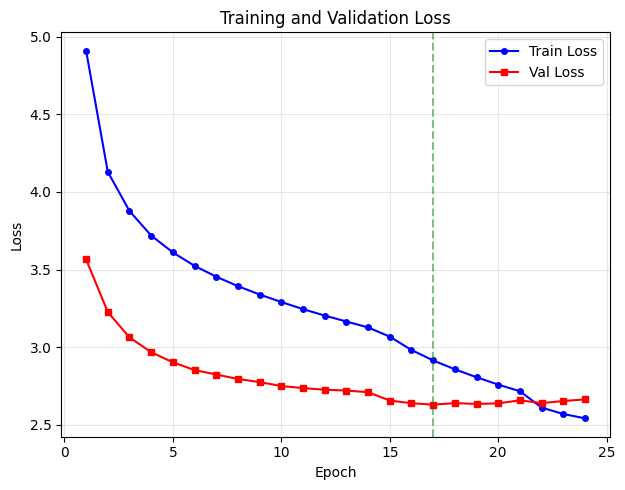

==== Training curves saved to: /kaggle/working/models/training_curves.png


In [14]:
# Visualize training progress

plt.figure(figsize=(12, 5))

# Loss curves
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses)+1), train_losses, 'b-o', label='Train Loss', markersize=4)
plt.plot(range(1, len(val_losses)+1), val_losses, 'r-s', label='Val Loss', markersize=4)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True, alpha=0.3)

# Mark best epoch
best_epoch = val_losses.index(min(val_losses)) + 1
plt.axvline(x=best_epoch, color='g', linestyle='--', alpha=0.5, label=f'Best (epoch {best_epoch})')

plt.tight_layout()
plt.savefig(str(MODELS_DIR / 'training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

print(f"==== Training curves saved to: {MODELS_DIR / 'training_curves.png'}")


### CELL 15: Caption Generation Function


In [15]:
# Greedy decoding for generating captions

def generate_caption_greedy(encoder, decoder, image, vocab, device, max_length=50):
    """
    Generate caption using greedy decoding.
    
    Args:
        encoder: trained encoder model
        decoder: trained decoder model
        image: preprocessed image tensor [1, 3, H, W]
        vocab: Vocabulary instance
        device: computation device
        max_length: maximum caption length
    
    Returns:
        List of generated words
    """
    encoder.eval()
    decoder.eval()
    
    with torch.no_grad():
        # Encode image
        encoder_out = encoder(image)
        
        # Initialize decoder
        h, c = decoder.init_hidden_state(encoder_out)
        
        # Start with START token
        word_idx = vocab.word2idx[vocab.START_TOKEN]
        words = []
        
        for _ in range(max_length):
            # Embed current word
            word_tensor = torch.LongTensor([word_idx]).to(device)
            embedding = decoder.embedding(word_tensor)
            
            # Attention
            context, alpha = decoder.attention(encoder_out, h)
            gate = decoder.sigmoid(decoder.f_beta(h))
            context = gate * context
            
            # LSTM step
            lstm_input = torch.cat([embedding, context], dim=1)
            h, c = decoder.decode_step(lstm_input, (h, c))
            
            # Predict next word
            scores = decoder.fc(h)
            word_idx = scores.argmax(dim=1).item()
            
            # Stop at END token
            if word_idx == vocab.word2idx[vocab.END_TOKEN]:
                break
            
            word = vocab.idx2word.get(word_idx, vocab.UNK_TOKEN)
            words.append(word)
        
        return words


print("[OK] Caption generation function defined")

[OK] Caption generation function defined


### CELL 16: Test Caption Generation


TESTING CAPTION GENERATION


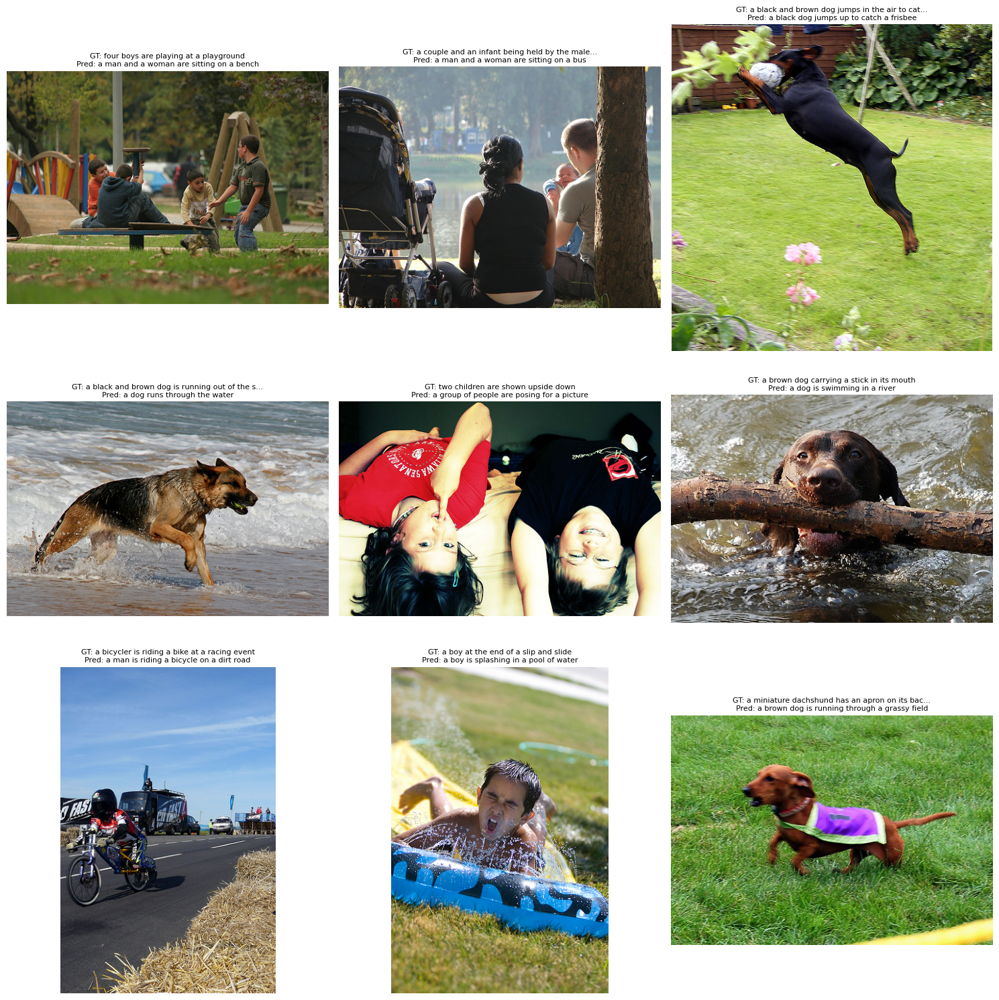


**** Sample predictions saved to: /kaggle/working/models/sample_predictions.png


In [16]:
# Load best model and test on sample images

print("\n" + "=" * 60)
print("TESTING CAPTION GENERATION")
print("=" * 60)

# Load best checkpoint
encoder.load_state_dict(torch.load(str(ENCODER_PATH), map_location=device))
decoder.load_state_dict(torch.load(str(DECODER_PATH), map_location=device))
encoder.eval()
decoder.eval()

# Test transform
test_transform = get_image_transforms(IMAGE_SIZE, is_training=False)

# Generate captions for test images
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for idx, img_name in enumerate(test_images[:9]):
    ax = axes[idx]
    
    # Load image
    img_path = IMAGES_DIR / img_name
    image = Image.open(img_path).convert('RGB')
    
    # Display image
    ax.imshow(image)
    ax.axis('off')
    
    # Generate caption
    image_tensor = test_transform(image).unsqueeze(0).to(device)
    predicted_words = generate_caption_greedy(encoder, decoder, image_tensor, vocab, device)
    predicted = ' '.join(predicted_words)
    
    # Ground truth
    ground_truth = image_to_captions[img_name][0]
    
    # Format for display
    gt_short = ground_truth[:45] + '...' if len(ground_truth) > 45 else ground_truth
    pred_short = predicted[:45] + '...' if len(predicted) > 45 else predicted
    
    ax.set_title(f"GT: {gt_short}\nPred: {pred_short}", fontsize=8, wrap=True)

plt.tight_layout()
plt.savefig(str(MODELS_DIR / 'sample_predictions.png'), dpi=150, bbox_inches='tight')
plt.show()

print(f"\n**** Sample predictions saved to: {MODELS_DIR / 'sample_predictions.png'}")



### CELL 17: Overfitting/Underfitting Analysis


OVERFITTING/UNDERFITTING ANALYSIS

==== Training Statistics:
   Final Train Loss: 2.5426
   Final Val Loss:   2.6649
   Loss Gap:         0.1223 (4.8%)
   Best Epoch:       17
   Total Epochs:     24
[OK] NO OVERFITTING
   - Train and val losses are close

[OK] CONVERGED


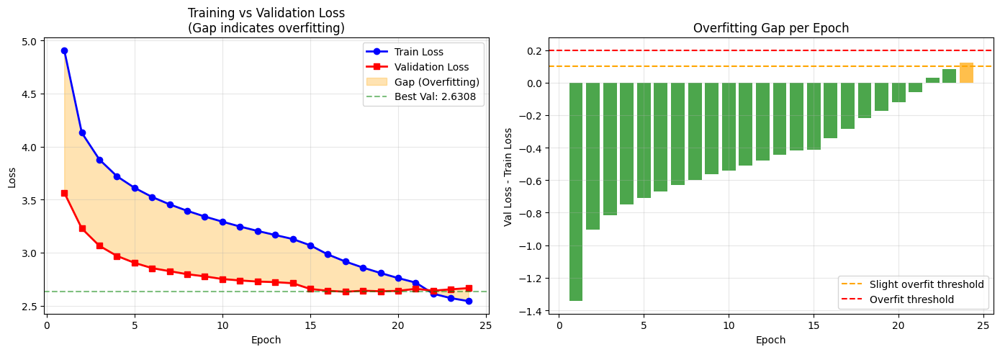


   Saved to: /kaggle/working/models/overfitting_analysis.png


In [17]:
# Analyze training behavior to detect overfitting or underfitting

print("\n" + "=" * 60)
print("OVERFITTING/UNDERFITTING ANALYSIS")
print("=" * 60)

def analyze_training(train_losses, val_losses):
    """
    Analyze training curves to detect overfitting or underfitting.
    """
    if len(train_losses) < 2:
        return "Not enough epochs to analyze"
    
    final_train = train_losses[-1]
    final_val = val_losses[-1]
    min_val = min(val_losses)
    best_epoch = val_losses.index(min_val) + 1
    
    loss_gap = final_val - final_train
    gap_ratio = loss_gap / final_train if final_train > 0 else 0
    
    late_val_losses = val_losses[-3:] if len(val_losses) >= 3 else val_losses
    val_trend = late_val_losses[-1] - late_val_losses[0]
    
    diagnosis = []
    
    print(f"\n==== Training Statistics:")
    print(f"   Final Train Loss: {final_train:.4f}")
    print(f"   Final Val Loss:   {final_val:.4f}")
    print(f"   Loss Gap:         {loss_gap:.4f} ({gap_ratio*100:.1f}%)")
    print(f"   Best Epoch:       {best_epoch}")
    print(f"   Total Epochs:     {len(train_losses)}")
    
    if gap_ratio > 0.2:
        diagnosis.append("[!!] OVERFITTING DETECTED")
        diagnosis.append("   - Large gap between train and val loss")
        diagnosis.append("   Recommendations:")
        diagnosis.append("   - Increase dropout")
        diagnosis.append("   - Add more data augmentation")
    elif gap_ratio > 0.1:
        diagnosis.append("[!!] SLIGHT OVERFITTING")
        diagnosis.append("   - Moderate gap between train and val loss")
    else:
        diagnosis.append("[OK] NO OVERFITTING")
        diagnosis.append("   - Train and val losses are close")
    
    if final_train > 3.0 and final_val > 3.0:
        diagnosis.append("\n[!!] UNDERFITTING DETECTED")
        diagnosis.append("   - Both losses are still high")
        diagnosis.append("   - Train for more epochs")
    
    if val_trend > 0.1:
        diagnosis.append(f"\n[!!] VALIDATION LOSS INCREASING")
        diagnosis.append(f"   - Best model was at epoch {best_epoch}")
    elif val_trend < -0.05:
        diagnosis.append("\n[OK] STILL IMPROVING")
        diagnosis.append("   - Consider training longer")
    else:
        diagnosis.append("\n[OK] CONVERGED")
    
    return "\n".join(diagnosis)

analysis_result = analyze_training(train_losses, val_losses)
print(analysis_result)

# Plot overfitting analysis
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax1 = axes[0]
epochs = range(1, len(train_losses) + 1)
ax1.plot(epochs, train_losses, 'b-o', label='Train Loss', linewidth=2)
ax1.plot(epochs, val_losses, 'r-s', label='Validation Loss', linewidth=2)
ax1.fill_between(epochs, train_losses, val_losses, alpha=0.3, color='orange', label='Gap (Overfitting)')
ax1.axhline(y=min(val_losses), color='g', linestyle='--', alpha=0.5, label=f'Best Val: {min(val_losses):.4f}')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training vs Validation Loss\n(Gap indicates overfitting)')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
loss_gaps = [v - t for t, v in zip(train_losses, val_losses)]
colors = ['green' if g < 0.1 else 'orange' if g < 0.2 else 'red' for g in loss_gaps]
ax2.bar(epochs, loss_gaps, color=colors, alpha=0.7)
ax2.axhline(y=0.1, color='orange', linestyle='--', label='Slight overfit threshold')
ax2.axhline(y=0.2, color='red', linestyle='--', label='Overfit threshold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Val Loss - Train Loss')
ax2.set_title('Overfitting Gap per Epoch')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(str(MODELS_DIR / 'overfitting_analysis.png'), dpi=150)
plt.show()
print(f"\n   Saved to: {MODELS_DIR / 'overfitting_analysis.png'}")


### CELL 18: BLEU Score Evaluation


BLEU SCORE EVALUATION

==== Evaluating on test set...


Calculating BLEU:   0%|          | 0/100 [00:00<?, ?it/s]


==== BLEU Score Results (Test Set):
----------------------------------------
   BLEU-1: 0.6309 (63.09%)
   BLEU-2: 0.3211 (32.11%)
   BLEU-3: 0.1601 (16.01%)
   BLEU-4: 0.0752 (7.52%)
   BLEU: 0.1222 (12.22%)

==== BLEU Score Interpretation:
   BLEU-1: Word-level accuracy (unigrams)
   BLEU-2: 2-word phrase accuracy
   BLEU-3: 3-word phrase accuracy
   BLEU-4: 4-word phrase accuracy (most important)
   BLEU:   Combined score with brevity penalty

   [!!] BLEU-4 < 0.10: Needs improvement


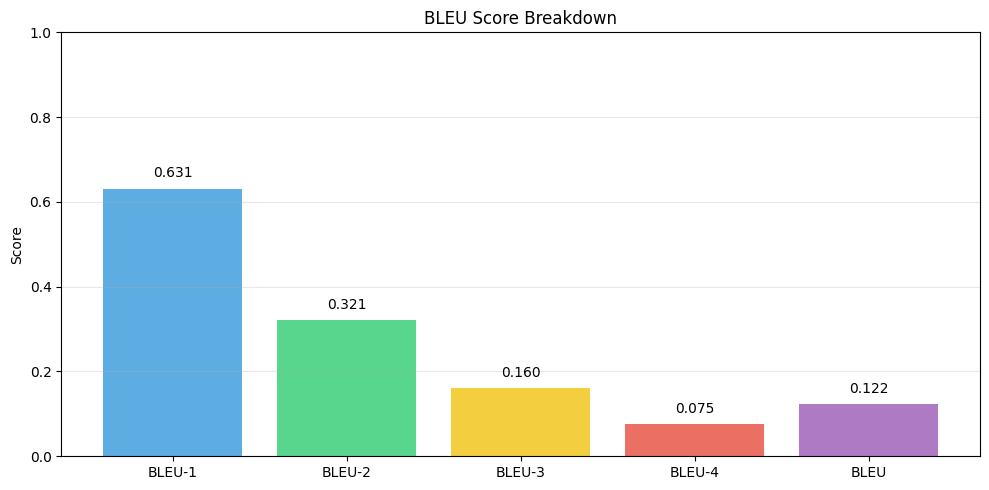


   Saved to: /kaggle/working/models/bleu_scores.png


In [18]:
# Calculate BLEU-1, BLEU-2, BLEU-3, BLEU-4 scores on test set

print("\n" + "=" * 60)
print("BLEU SCORE EVALUATION")
print("=" * 60)

from collections import Counter
import math

def ngrams(sequence, n):
    """Generate n-grams from a sequence."""
    return [tuple(sequence[i:i+n]) for i in range(len(sequence) - n + 1)]

def modified_precision(candidate, references, n):
    """Calculate modified precision for n-grams."""
    candidate_ngrams = ngrams(candidate, n)
    if len(candidate_ngrams) == 0:
        return 0.0
    
    candidate_counts = Counter(candidate_ngrams)
    max_ref_counts = Counter()
    
    for ref in references:
        ref_ngrams = ngrams(ref, n)
        ref_counts = Counter(ref_ngrams)
        for ngram in candidate_counts:
            max_ref_counts[ngram] = max(max_ref_counts.get(ngram, 0), ref_counts.get(ngram, 0))
    
    clipped_counts = {ngram: min(count, max_ref_counts.get(ngram, 0)) 
                      for ngram, count in candidate_counts.items()}
    
    return sum(clipped_counts.values()) / len(candidate_ngrams)

def brevity_penalty(candidate, references):
    """Calculate brevity penalty."""
    c = len(candidate)
    ref_lengths = [len(r) for r in references]
    r = min(ref_lengths, key=lambda x: abs(x - c))
    
    if c >= r:
        return 1.0
    else:
        return math.exp(1 - r / c) if c > 0 else 0.0

def bleu_score(candidate, references, max_n=4):
    """Calculate BLEU score."""
    scores = {}
    
    for n in range(1, max_n + 1):
        p_n = modified_precision(candidate, references, n)
        scores[f'BLEU-{n}'] = p_n
    
    bp = brevity_penalty(candidate, references)
    
    log_precisions = []
    for n in range(1, max_n + 1):
        p_n = scores[f'BLEU-{n}']
        if p_n > 0:
            log_precisions.append(math.log(p_n))
    
    if len(log_precisions) == max_n:
        geometric_mean = math.exp(sum(log_precisions) / max_n)
        scores['BLEU'] = bp * geometric_mean
    else:
        scores['BLEU'] = 0.0
    
    return scores

# Evaluate on test set
print("\n==== Evaluating on test set...")

all_bleu_scores = {'BLEU-1': [], 'BLEU-2': [], 'BLEU-3': [], 'BLEU-4': [], 'BLEU': []}
transform = get_image_transforms(IMAGE_SIZE, is_training=False)

for img_name in tqdm(test_images[:100], desc="Calculating BLEU"):
    img_path = IMAGES_DIR / img_name
    image = Image.open(img_path).convert('RGB')
    image_tensor = transform(image).unsqueeze(0).to(device)
    
    references = [cap.split() for cap in image_to_captions[img_name]]
    predicted_words = generate_caption_greedy(encoder, decoder, image_tensor, vocab, device)
    
    scores = bleu_score(predicted_words, references)
    for key in all_bleu_scores:
        all_bleu_scores[key].append(scores[key])

print("\n==== BLEU Score Results (Test Set):")
print("-" * 40)
avg_scores = {}
for metric, values in all_bleu_scores.items():
    avg = sum(values) / len(values)
    avg_scores[metric] = avg
    print(f"   {metric}: {avg:.4f} ({avg*100:.2f}%)")

print("\n==== BLEU Score Interpretation:")
print("   BLEU-1: Word-level accuracy (unigrams)")
print("   BLEU-2: 2-word phrase accuracy")
print("   BLEU-3: 3-word phrase accuracy")
print("   BLEU-4: 4-word phrase accuracy (most important)")
print("   BLEU:   Combined score with brevity penalty")

bleu4 = avg_scores['BLEU-4']
if bleu4 > 0.30:
    print("\n   [OK] BLEU-4 > 0.30: Excellent performance!")
elif bleu4 > 0.20:
    print("\n   [OK] BLEU-4 > 0.20: Good performance")
elif bleu4 > 0.10:
    print("\n   [!!] BLEU-4 > 0.10: Acceptable performance")
else:
    print("\n   [!!] BLEU-4 < 0.10: Needs improvement")

# Plot BLEU scores
plt.figure(figsize=(10, 5))
metrics = list(avg_scores.keys())
values = list(avg_scores.values())
colors = ['#3498db', '#2ecc71', '#f1c40f', '#e74c3c', '#9b59b6']
bars = plt.bar(metrics, values, color=colors, alpha=0.8)
plt.ylim(0, 1)
plt.ylabel('Score')
plt.title('BLEU Score Breakdown')
plt.grid(True, alpha=0.3, axis='y')

for bar, val in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
             f'{val:.3f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig(str(MODELS_DIR / 'bleu_scores.png'), dpi=150)
plt.show()
print(f"\n   Saved to: {MODELS_DIR / 'bleu_scores.png'}")


### CELL 19: Attention Visualization


ATTENTION VISUALIZATION

**** Generating attention visualizations...


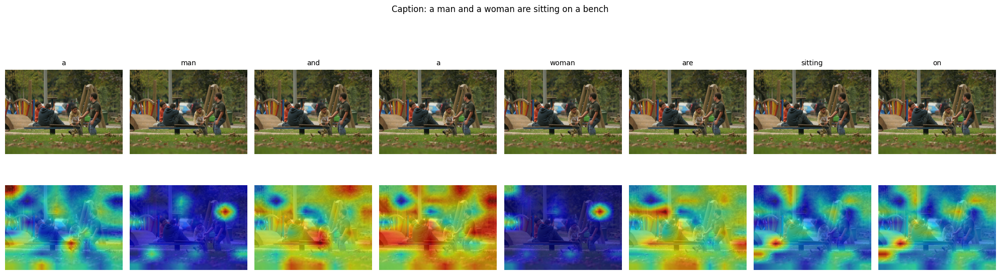


   **** Image: 2872743471_30e0d1a90a.jpg
   ==== Caption: a man and a woman are sitting on a bench


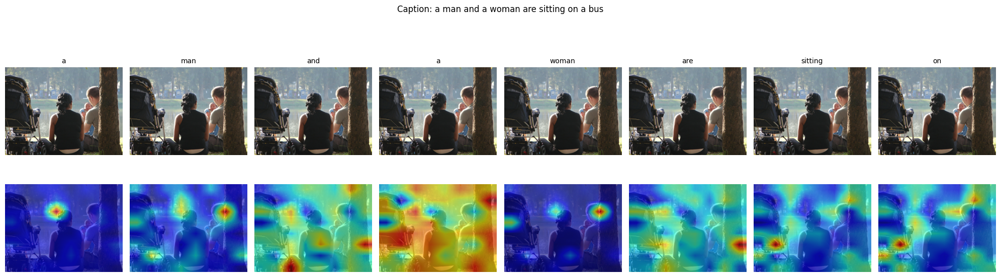


   **** Image: 1022454428_b6b660a67b.jpg
   ==== Caption: a man and a woman are sitting on a bus


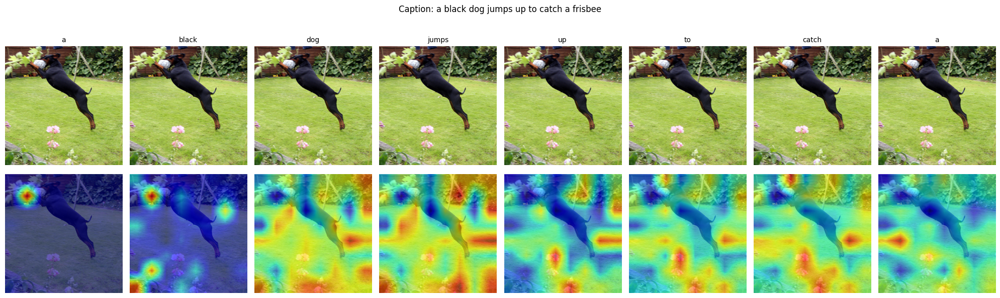


   **** Image: 2848571082_26454cb981.jpg
   ==== Caption: a black dog jumps up to catch a frisbee

   Saved to: /kaggle/working/models/attention_viz_*.png


In [19]:
# Visualize attention weights over image regions

print("\n" + "=" * 60)
print("ATTENTION VISUALIZATION")
print("=" * 60)

def visualize_attention(image_path, encoder, decoder, vocab, transform, device):
    """Visualize attention weights for each generated word."""
    original_image = Image.open(image_path).convert('RGB')
    image = transform(original_image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        encoder_out = encoder(image)
        h, c = decoder.init_hidden_state(encoder_out)
        
        word_idx = vocab.word2idx['<START>']
        words = []
        attentions = []
        
        for _ in range(30):
            word_tensor = torch.LongTensor([word_idx]).to(device)
            embedding = decoder.embedding(word_tensor)
            
            context, alpha = decoder.attention(encoder_out, h)
            attentions.append(alpha.cpu().numpy().reshape(8, 8))
            
            gate = decoder.sigmoid(decoder.f_beta(h))
            context = gate * context
            
            lstm_input = torch.cat([embedding, context], dim=1)
            h, c = decoder.decode_step(lstm_input, (h, c))
            
            scores = decoder.fc(h)
            word_idx = scores.argmax(dim=1).item()
            
            if word_idx == vocab.word2idx['<END>']:
                break
            
            words.append(vocab.idx2word.get(word_idx, '<UNK>'))
    
    return words, attentions, original_image

print("\n**** Generating attention visualizations...")

for idx, img_name in enumerate(test_images[:3]):
    img_path = IMAGES_DIR / img_name
    words, attentions, orig_img = visualize_attention(
        img_path, encoder, decoder, vocab, transform, device
    )
    
    n_words = min(len(words), 8)
    if n_words > 0:
        fig, axes = plt.subplots(2, n_words, figsize=(2.5 * n_words, 6))
        
        for i in range(n_words):
            axes[0, i].imshow(orig_img)
            axes[0, i].axis('off')
            axes[0, i].set_title(words[i], fontsize=10)
            
            attention_map = attentions[i]
            axes[1, i].imshow(orig_img)
            attention_resized = np.array(Image.fromarray(attention_map).resize(orig_img.size, Image.BILINEAR))
            axes[1, i].imshow(attention_resized, alpha=0.6, cmap='jet')
            axes[1, i].axis('off')
        
        plt.suptitle(f"Caption: {' '.join(words)}", fontsize=12, y=1.02)
        plt.tight_layout()
        plt.savefig(str(MODELS_DIR / f'attention_viz_{idx+1}.png'), dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"\n   **** Image: {img_name}")
        print(f"   ==== Caption: {' '.join(words)}")

print(f"\n   Saved to: {MODELS_DIR}/attention_viz_*.png")


### CELL 20: Visual Sample Predictions


SAMPLE PREDICTIONS WITH IMAGES


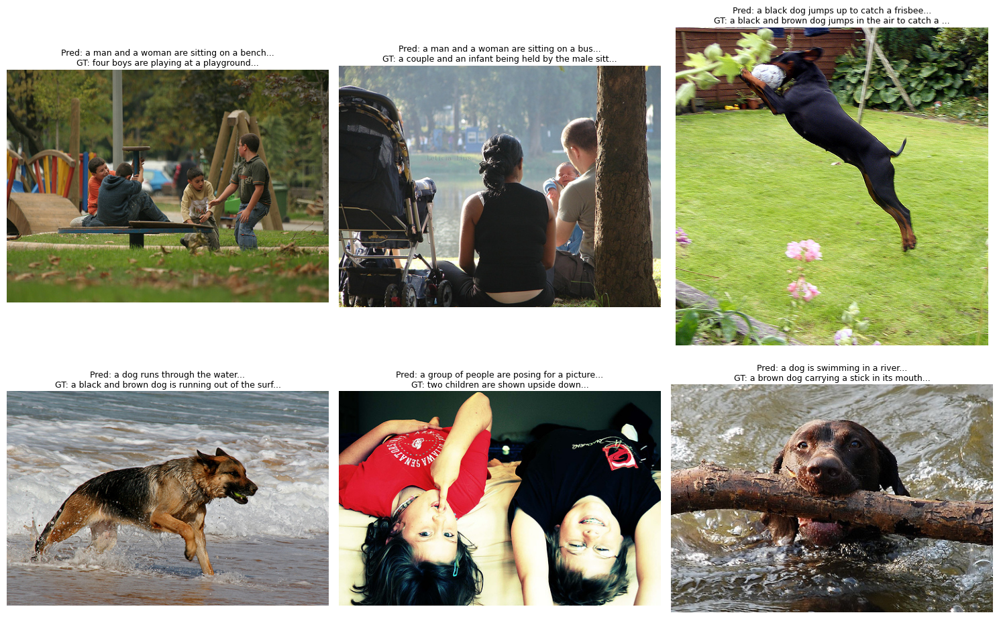


   Saved to: /kaggle/working/models/sample_predictions.png


In [20]:
# Show image-caption pairs side by side

print("\n" + "=" * 60)
print("SAMPLE PREDICTIONS WITH IMAGES")
print("=" * 60)

def show_predictions(test_images, encoder, decoder, vocab, image_to_captions, 
                     images_dir, transform, device, n_samples=6):
    """Display a grid of sample predictions with ground truth."""
    n_cols = 3
    n_rows = (n_samples + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.flatten() if n_samples > 1 else [axes]
    
    for idx, img_name in enumerate(test_images[:n_samples]):
        ax = axes[idx]
        
        img_path = images_dir / img_name
        image = Image.open(img_path).convert('RGB')
        ax.imshow(image)
        ax.axis('off')
        
        image_tensor = transform(image).unsqueeze(0).to(device)
        predicted_words = generate_caption_greedy(encoder, decoder, image_tensor, vocab, device)
        predicted = ' '.join(predicted_words)
        
        gt = image_to_captions[img_name][0]
        
        ax.set_title(f"Pred: {predicted[:50]}...\nGT: {gt[:50]}...", 
                     fontsize=9, wrap=True)
    
    for idx in range(n_samples, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(str(MODELS_DIR / 'sample_predictions.png'), dpi=150, bbox_inches='tight')
    plt.show()
    print(f"\n   Saved to: {MODELS_DIR / 'sample_predictions.png'}")

show_predictions(
    test_images, encoder, decoder, vocab, image_to_captions,
    IMAGES_DIR, transform, device, n_samples=6
)


### CELL 21: Final Summary

In [21]:
# Print comprehensive training summary

print("\n" + "=" * 60)
print("==== TRAINING SUMMARY REPORT")
print("=" * 60)

print(f"""
==== Configuration:
   - Encoder: InceptionV3 (fine-tuned after epoch {FINE_TUNE_ENCODER_AFTER})
   - Decoder: LSTM with Bahdanau Attention
   - Embedding dim: {EMBEDDING_DIM}
   - Hidden dim: {DECODER_DIM}
   - Attention dim: {ATTENTION_DIM}
   - Dropout: {DROPOUT}

==== Training Results:
   - Total epochs: {len(train_losses)}
   - Best epoch: {val_losses.index(min(val_losses)) + 1}
   - Final train loss: {train_losses[-1]:.4f}
   - Final val loss: {val_losses[-1]:.4f}
   - Best val loss: {min(val_losses):.4f}

==== BLEU Scores (Test Set):
   - BLEU-1: {avg_scores['BLEU-1']:.4f}
   - BLEU-2: {avg_scores['BLEU-2']:.4f}
   - BLEU-3: {avg_scores['BLEU-3']:.4f}
   - BLEU-4: {avg_scores['BLEU-4']:.4f}
   - Combined BLEU: {avg_scores['BLEU']:.4f}

>>> Saved Files:
   - Encoder: {ENCODER_PATH}
   - Decoder: {DECODER_PATH}
   - Vocabulary: {VOCAB_PATH}
   - Training curves: {MODELS_DIR / 'training_curves.png'}
   - Overfitting analysis: {MODELS_DIR / 'overfitting_analysis.png'}
   - BLEU scores: {MODELS_DIR / 'bleu_scores.png'}
   - Attention visualizations: {MODELS_DIR / 'attention_viz_*.png'}
   - Sample predictions: {MODELS_DIR / 'sample_predictions.png'}
""")

print("[OK] All cells complete! Notebook ready for presentation.")




==== TRAINING SUMMARY REPORT

==== Configuration:
   - Encoder: InceptionV3 (fine-tuned after epoch 15)
   - Decoder: LSTM with Bahdanau Attention
   - Embedding dim: 256
   - Hidden dim: 512
   - Attention dim: 512
   - Dropout: 0.5

==== Training Results:
   - Total epochs: 24
   - Best epoch: 17
   - Final train loss: 2.5426
   - Final val loss: 2.6649
   - Best val loss: 2.6308

==== BLEU Scores (Test Set):
   - BLEU-1: 0.6309
   - BLEU-2: 0.3211
   - BLEU-3: 0.1601
   - BLEU-4: 0.0752
   - Combined BLEU: 0.1222

>>> Saved Files:
   - Encoder: /kaggle/working/models/encoder.pth
   - Decoder: /kaggle/working/models/decoder.pth
   - Vocabulary: /kaggle/working/models/vocab.pkl
   - Training curves: /kaggle/working/models/training_curves.png
   - Overfitting analysis: /kaggle/working/models/overfitting_analysis.png
   - BLEU scores: /kaggle/working/models/bleu_scores.png
   - Attention visualizations: /kaggle/working/models/attention_viz_*.png
   - Sample predictions: /kaggle/working

### CELL 22: Download Models (Kaggle Output)

In [22]:
# Package models for download from Kaggle

import shutil

print("\n" + "=" * 60)
print("PACKAGING MODELS FOR DOWNLOAD")
print("=" * 60)

# List saved files
print("\nSaved files:")
for f in MODELS_DIR.iterdir():
    size_mb = f.stat().st_size / (1024 * 1024)
    print(f"   >>> {f.name} ({size_mb:.2f} MB)")

# Create a zip file for easy download
zip_path = KAGGLE_OUTPUT / "caption_models"
shutil.make_archive(str(zip_path), 'zip', str(MODELS_DIR))
print(f"\n===> Download: {zip_path}.zip")
print("\nTo use these models locally:")
print("1. Download the zip from Kaggle Output tab")
print("2. Extract to backend/models/")
print("3. Run: uvicorn main:app --host 0.0.0.0 --port 8000")

print("\n[DONE] ALL COMPLETE!")


PACKAGING MODELS FOR DOWNLOAD

Saved files:
   >>> attention_viz_2.png (1.24 MB)
   >>> decoder.pth (48.12 MB)
   >>> bleu_scores.png (0.03 MB)
   >>> sample_predictions.png (4.17 MB)
   >>> encoder.pth (1120.63 MB)
   >>> training_curves.png (0.04 MB)
   >>> attention_viz_3.png (1.94 MB)
   >>> attention_viz_1.png (1.25 MB)
   >>> overfitting_analysis.png (0.10 MB)
   >>> vocab.pkl (0.14 MB)

===> Download: /kaggle/working/caption_models.zip

To use these models locally:
1. Download the zip from Kaggle Output tab
2. Extract to backend/models/
3. Run: uvicorn main:app --host 0.0.0.0 --port 8000

[DONE] ALL COMPLETE!
